# A. Preface

RFM analysis is a technique used to identify existing customers who are most likely to respond to a new offer. This technique is commonly used in direct marketing. RFM analysis is based on the following simple theory:
- The most important factor in identifying customers who are likely to respond to a new offer is recency. Customers who purchased more recently are more likely to purchase again than are customers who purchased further in the past.
- The second most important factor is frequency. Customers who have made more purchases in the past are more likely to respond than are those who have made fewer purchases.
- The third most important factor is total amount spent, which is referred to as monetary. Customers who have spent more (in total for all purchases) in the past are more likely to respond than those who have spent less.

#### How RFM Analysis Works
- Customers are assigned a recency score based on date of most recent purchase or time interval since most recent purchase. This score is based on a simple ranking of recency values into a small number of categories. For example, if you use five categories, the customers with the most recent purchase dates receive a recency ranking of 5, and those with purchase dates furthest in the past receive a recency ranking of 1.
- In a similar fashion, customers are then assigned a frequency ranking, with higher values representing a higher frequency of purchases. For example, in a five category ranking scheme, customers who purchase most often receive a frequency ranking of 5.
- Finally, customers are ranked by monetary value, with the highest monetary values receiving the highest ranking. Continuing the five-category example, customers who have spent the most would receive a monetary ranking of 5.

The result is four scores for each customer: recency, frequency, monetary, and combined RFM score, which is simply the three individual scores concatenated into a single value. The "best" customers (those most likely to respond to an offer) are those with the highest combined RFM scores. For example, in a five-category ranking, there is a total of 125 possible combined RFM scores, and the highest combined RFM score is 555.

RFM analysis looks at all of the bookings and transactions in your customer database during a specific time period, usually the last 2-3 years. The purpose of the database analysis is to determine the value of your guests based on how much they spend, how often they made a purchasing, and how recently they’ve made a purchasing.<br><br>

#### Case Study
This task is carried out with the aim to apply RFM analysis to sample data relating to transaction data from an e-Commerce.<br>
I will use Quintiles Method which is RFM scoring will be from 1 to 5 to Recency, Frequency and Monetary. 5 is the best/highest value, and 1 is the lowest/worst value. A final RFM score is calculated simply by combining individual RFM score numbers.<br>


# B. Library

In [1]:
# Import Library 
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
import matplotlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
import matplotlib.dates as mdates
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.basemap import Basemap
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import folium 
from folium.plugins import HeatMap
import squarify
from dateutil.parser import parse
from datetime import datetime, timedelta
import calendar
from collections import defaultdict
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as shc
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import warnings
warnings.filterwarnings('ignore')

years = mdates.YearLocator()
months = mdates.MonthLocator()
days = mdates.DayLocator()
years_fmt = mdates.DateFormatter('%b \'%y')
months_fmt = mdates.DateFormatter('%b %d')
days_fmt = mdates.DateFormatter('%b %d')

def example_score_recency():
    img = matplotlib.image.imread('docs/example_score_recency.png')
    fig, ax = plt.subplots(dpi=200)
    plt.imshow(img, aspect='equal', interpolation='catrom')
    ax.axis('off')
    plt.show()

# C. Data Information

In [2]:
# Load Data and Fetch Informations
## load data
data = pd.read_csv('data/data-implementation-1.csv', 
                   encoding="ISO-8859-1", 
                   dtype={'CustomerID': str,'InvoiceID': str})
## converting date string to datetime format
data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])
## cleansing data only successful purchases
failed_transactions = len(set(data[data['Quantity']<0]['InvoiceNo']))
data = data[(data['Quantity'] > 0)]
## cleansing data only only registered customer
unknown_transactions = len(set(data[data['CustomerID'].isna()]['InvoiceNo']))
data = data.dropna(subset=['CustomerID'], how='all')
## filter data only a year ago from 2011-12-09
data = data[data['InvoiceDate'] >= '2010-12-10']

## display data information about data type and missing values
print(data.info())
print()
## display data first 5 rows
display(data.head(5))

## display important data information
print('Total data:\n{:,}\n'.format(len(data)))
print('Total customers:\n{:,}\n'.format(len(set(data['CustomerID']))))
print('Total products bought:\n{:,}\n'.format(len(set(data['StockCode']))))
print('Total successful transactions:\n{:,}\n'.format(len(set(data['InvoiceNo']))))
print('Total failed transactions:\n{:,}\n'.format(failed_transactions))
print('Total unknown transactions:\n{:,}\n'.format(unknown_transactions))
print('Range date:\n{} ~ {}\n'.format(min(data['InvoiceDate']).strftime('%b %d, %Y %H:%M'), 
                                      max(data['InvoiceDate']).strftime('%b %d, %Y %H:%M')))
print('Country distinct:\n{}\n'.format(', '.join(list(set(data['Country'])))))
print('Total countries:\n{:,}\n'.format(len(set(data['Country']))))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 383419 entries, 22523 to 541908
Data columns (total 8 columns):
InvoiceNo      383419 non-null object
StockCode      383419 non-null object
Description    383419 non-null object
Quantity       383419 non-null int64
InvoiceDate    383419 non-null datetime64[ns]
UnitPrice      383419 non-null float64
CustomerID     383419 non-null object
Country        383419 non-null object
dtypes: datetime64[ns](1), float64(1), int64(1), object(5)
memory usage: 26.3+ MB
None



,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
22523,538172,21562,HAWAIIAN GRASS SKIRT,12,2010-12-10 09:33:00,1.25,15805,United Kingdom
22524,538172,79321,CHILLI LIGHTS,8,2010-12-10 09:33:00,4.95,15805,United Kingdom
22525,538172,22041,"RECORD FRAME 7"" SINGLE SIZE",12,2010-12-10 09:33:00,2.55,15805,United Kingdom
22526,538172,84558A,3D DOG PICTURE PLAYING CARDS,12,2010-12-10 09:33:00,2.95,15805,United Kingdom
22527,538172,22952,60 CAKE CASES VINTAGE CHRISTMAS,24,2010-12-10 09:33:00,0.55,15805,United Kingdom


Total data:
383,419

Total customers:
4,265

Total products bought:
3,627

Total successful transactions:
17,760

Total failed transactions:
5,172

Total unknown transactions:
2,192

Range date:
Dec 10, 2010 09:33 ~ Dec 09, 2011 12:50

Country distinct:
Austria, Spain, United Arab Emirates, Saudi Arabia, Norway, Lebanon, Cyprus, Italy, France, United Kingdom, Denmark, Brazil, European Community, Belgium, EIRE, Bahrain, Malta, Portugal, USA, Canada, Finland, Singapore, Sweden, Channel Islands, Netherlands, Germany, Unspecified, Poland, RSA, Czech Republic, Israel, Switzerland, Australia, Japan, Iceland, Greece

Total countries:
36



# D. Exploratory Data Analysis

#### 1.  Most Total Transactions per Country

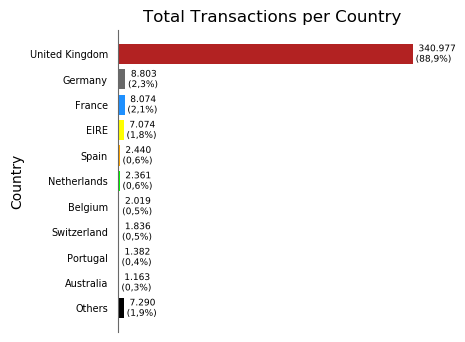

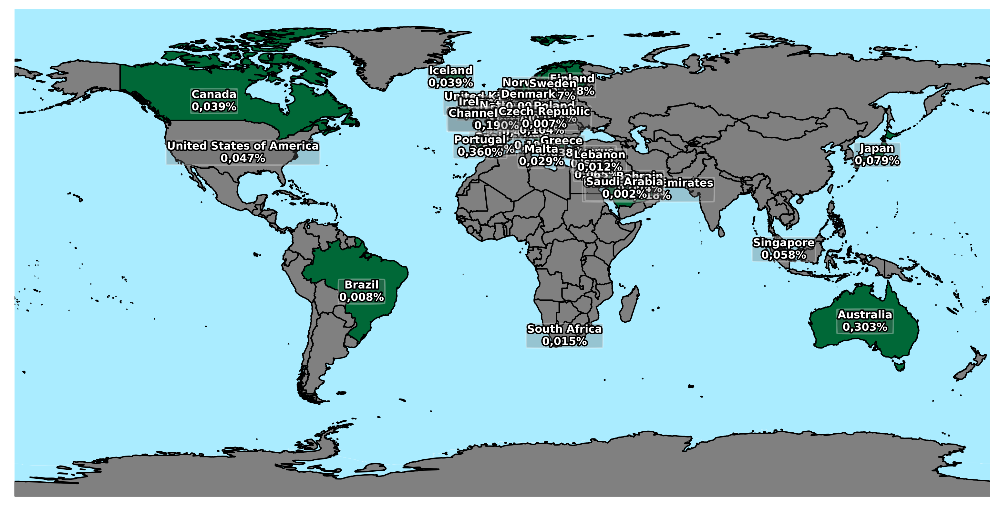

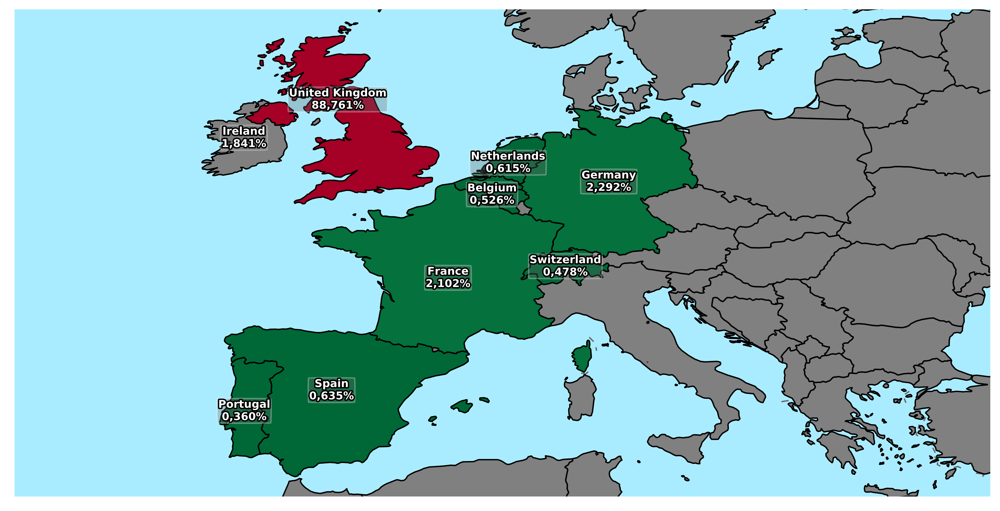

In [3]:
# Visualize Descriptive Statistics About Most Total Transactions per Country 

## create barchart for top 10 country with most total transactions
### preparing data to plot
plot = data.groupby('Country').count()
plot = plot[['Quantity']].sort_values('Quantity', ascending=False).reset_index()
### grouping other countries rank above 10 as one called "Others"
other_total = plot[10:].sum()['Quantity']
plot = plot[:11]
plot = plot.sort_values('Quantity').reset_index(drop=True)
plot.loc[0, ('Country','Quantity')] = ('Others', other_total)
### change data type from float to integer
plot['Quantity'] = plot['Quantity'].astype(int)
### define colors for barchart
list_colors = list(reversed(['firebrick','dimgray','dodgerblue','yellow',
                             'orange','lime','blueviolet','magenta',
                             'forestgreen','indigo','k']))
### create empty canvas to plot barchart
fig, ax = plt.subplots(figsize=(4,4), dpi=100)
### plotting data as barchart
ax.barh(y=plot['Country'], width=plot['Quantity'], color=list_colors)
### removing border of canvas (top, bottom, right) and coloring left border
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('dimgrey')
### setup ticks for barchart
ax.tick_params(which='major', axis='x', color='w')
ax.tick_params(which='major', axis='y', color='w', labelsize=7)
ax.set_xticklabels([])
### add label information for each bar
for i, patch in enumerate(ax.patches):
    bl = patch.get_xy()
    x = patch.get_width() + bl[0]
    y = .5 * patch.get_height() + bl[1] 
    gap = max(plot['Quantity'])/sum(plot['Quantity'])
    t = round(patch.get_width()/sum(plot['Quantity']) * 100, 2)
    txt = ax.text(x+gap,y,'  {:,}\n ({:.1f}%)'.format(patch.get_width(), t)\
                                                      .replace(',','*')\
                                                      .replace('.',',')\
                                                      .replace('*','.'),
                  ha='left', va="center", fontsize=6.5, color='k', rotation=0)
    txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='w')])
### give name y axis as "Country"
ax.set_ylabel('Country')
### give title for barchart
ax.set_title('Total Transactions per Country')
### shows barchart
plt.show()


## create an interactive geomap for another method of visualization
def correct_name(country, original_data=True):
    """
    a function to correcting country name from dataset or latlon file.
    so it can be plotted.
    """
    if original_data:
        if country == 'USA':
            return 'United States of America'
        elif country == 'RSA':
            return 'South Africa'
        elif country == 'EIRE':
            return 'Ireland'
        else:
            return country
    else:
        if country == 'United States':
            return 'USA'
        elif country == 'Ireland':
            return 'EIRE'
        elif country == 'Jersey' or country == 'Guernsey':
            return 'Channel Islands'
        elif country == 'South Africa':
            return 'RSA'
        else:
            return country
    
### load geo json file
state_geo = json.loads(open('data/world.geo.json-master/countries.geo.json').read())
### get 3 digit country code from geo json file
code_country = []
for i in state_geo['features']:
    code_country.append({'code': i['id'], 'country':i['properties']['name']})
code_country = pd.DataFrame(code_country)
### preparing data to plot
plot = data.groupby('Country').count()[['Quantity']].sort_values('Quantity', 
                                                                 ascending=False
                                                                ).reset_index()
### load latitude longitude from json file
universe_latlon = pd.DataFrame([json.loads(line) 
                                for line in open('data/latlon_countries.json').readlines()])
### correcting country name from latlon file
universe_latlon['COUNTRY'] = universe_latlon['COUNTRY'].apply(lambda x: 
                                                              correct_name(x, False))
### merging latlon to dataset
plot = pd.merge(plot, 
                universe_latlon, 
                left_on='Country', 
                right_on='COUNTRY', 
                how='left'
               ).drop(columns=['COUNTRY','CODE'])
### correcting country name from dataset
plot['Country'] = plot['Country'].apply(lambda x: correct_name(x))
### calculate percentage of total transactions for each country
plot['Percentage'] = plot['Quantity'].apply(lambda x: 100*x/sum(plot['Quantity']))
### merging 3 digit country code to dataset
plot = pd.merge(plot, 
                code_country, 
                left_on='Country', 
                right_on='country', 
                how='left'
               ).drop(columns=['country'])
### setup canvas for geomap using folium library
m = folium.Map(location=[55.378051,-3.435973], zoom_start=3)
### plot dataset to folium geomap
folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=plot,
    columns=['code', 'Percentage'],
    nan_fill_color='transparent',
    key_on='feature.id',
    fill_color='RdYlGn_r',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Total Transactions (%)',
    highlight=True,
    overlay=True
).add_to(m)
### add layer control to canvas
folium.LayerControl().add_to(m)
### shows folium geomap
display(m)


## create a static map geomap for another method of visualization 
### setup canvas for static geomap
fig = plt.figure(figsize=(13, 9), dpi=300)
ax = fig.add_subplot(111)
m = Basemap(resolution='l')
m.drawcountries(linewidth=1, color='dimgray')
m.drawmapboundary(fill_color='#aaecff', linewidth=0)
m.drawcoastlines(linewidth=0.1, color="white")
open_map = 'data/ne_50m_admin_0_countries/ne_50m_admin_0_countries'
m.readshapefile(open_map, name='loaded_map', drawbounds=True)
### defining colormap for each country
max_count = max(plot['Quantity'])
counter = plot.set_index("Country").T.to_dict('records')[0]
score_cmap = counter.values()
cmap = plt.cm.RdYlGn_r
norm = plt.Normalize(min(score_cmap), max(score_cmap))
### plot data to geomap
patches = []
handles_legend = []
check = []
EU = ['Austria', 'Italy', 'Belgium', 'Latvia', 'Bulgaria', 'Lithuania', 
      'Croatia', 'Luxembourg', 'Cyprus', 'Malta', 'Czech Republic', 
      'Netherlands', 'Denmark', 'Poland', 'Estonia', 'Portugal', 
      'Finland', 'Romania', 'France', 'Slovakia', 'Germany', 'Slovenia', 
      'Greece', 'Spain', 'Hungary', 'Sweden', 'Ireland', 'United Kingdom']
for info, shape in zip(m.loaded_map_info, m.loaded_map):
    country = info['NAME_EN']
    if country == 'United States of America':
        country = 'USA'
    elif country == 'South Africa':
        country = 'RSA'
    elif country == 'Jersey':
        country = 'Channel Islands'
    elif country == 'Guernsey':
        country = 'Channel Islands'
    elif country == 'Ireland':
        country = 'EIRE'

    if country in list(counter.keys()):
        color = cmap(norm(counter[country]))
        patches.append(Polygon(np.array(shape), True, color=color))
        if country not in check:
            check.append(country)
            handles_legend.append({"country": country,
                                   "count": counter[country],
                                   "color": color})
    else:
        color = 'gray'
        patches.append(Polygon(np.array(shape), True, color=color))
pc = PatchCollection(patches, 
                     match_original=True, 
                     edgecolor='k', 
                     linewidths=.5, 
                     zorder=2)
ax.add_collection(pc)
### add label to each country on geomap
bbox_props = dict(boxstyle="round4,pad=0.1", 
                  fc="dimgray", 
                  ec="w", 
                  lw=1, 
                  alpha=.3)
for i in range(len(plot)):
    color = cmap(norm(counter[plot['Country'][i]]))
    
    if (plot['Country'][i] == 'Canada' or
        plot['Country'][i] == 'USA' or
        plot['Country'][i] == 'Iceland' or
        plot['Country'][i] == 'Australia' or
        plot['Country'][i] == 'Singapore' or
        plot['Country'][i] == 'RSA' or
        plot['Country'][i] == 'Japan'):
        arrow_x, arrow_y = m(plot['LONGITUDE'][i], 
                             plot['LATITUDE'][i])
        txt = plt.annotate(s='{}\n{:,.3f}%'.format(plot['Country'][i], 
                                                   plot['Percentage'][i]).replace('.',','), 
                           xy=(arrow_x, arrow_y), 
                           color='w', 
                           fontweight='bold', 
                           fontsize=8, 
                           ha='center', 
                           va='center', 
                           zorder=10, 
                           bbox=bbox_props)
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])
    else:
        arrow_x, arrow_y = m(plot['LONGITUDE'][i], 
                             plot['LATITUDE'][i])
        txt = plt.annotate(s='{}\n{:,.3f}%'.format(plot['Country'][i], 
                                                   plot['Percentage'][i]).replace('.',','), 
                           xy=(arrow_x, arrow_y), 
                           color='w', 
                           fontweight='bold', 
                           fontsize=8, 
                           ha='center', 
                           va='center', 
                           zorder=10, 
                           bbox=bbox_props)
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])
### shows geomap
plt.show()

## create a static map geomap that zoomed in country with most total transactions
plot = plot[:9]
### setup canvas for static geomap
fig = plt.figure(figsize=(13, 9), dpi=300)
ax = fig.add_subplot(111)
m = Basemap(llcrnrlat=35, urcrnrlat=60, llcrnrlon=-20, urcrnrlon=30, resolution='l')
m.drawcountries(linewidth=1, color='dimgray')
m.drawmapboundary(fill_color='#aaecff', linewidth=0)
m.drawcoastlines(linewidth=0.1, color="white")
open_map = 'data/ne_50m_admin_0_countries/ne_50m_admin_0_countries'
m.readshapefile(open_map, name='loaded_map', drawbounds=True)
### defining colormap for each country
max_count = max(plot['Quantity'])
counter = plot.set_index("Country").T.to_dict('records')[0]
score_cmap = counter.values()
cmap = plt.cm.RdYlGn_r
norm = plt.Normalize(min(score_cmap), max(score_cmap))
### plot data to geomap
patches = []
handles_legend = []
check = []
for info, shape in zip(m.loaded_map_info, m.loaded_map):
    country = info['NAME_EN']
    if country == 'United States of America':
        country = 'USA'
    elif country == 'South Africa':
        country = 'RSA'
    elif country == 'Jersey':
        country = 'Channel Islands'
    elif country == 'Guernsey':
        country = 'Channel Islands'
    elif country == 'Ireland':
        country = 'EIRE'

    if country in list(counter.keys()):
        color = cmap(norm(counter[country]))
        patches.append(Polygon(np.array(shape), True, color=color))
        if country not in check:
            check.append(country)
            handles_legend.append({"country": country,
                                   "count": counter[country],
                                   "color": color})
    else:
        color = 'gray'
        patches.append(Polygon(np.array(shape), True, color=color))
pc = PatchCollection(patches, 
                     match_original=True, 
                     edgecolor='k', 
                     linewidths=.5, 
                     zorder=2)
ax.add_collection(pc)
### add label to each country on geomap
bbox_props = dict(boxstyle="round4,pad=0.1", 
                  fc="dimgray", 
                  ec="w", 
                  lw=1, 
                  alpha=.3)
for i in range(len(plot)):
    color = cmap(norm(counter[plot['Country'][i]]))
    
    if (plot['Country'][i] == 'Canada' or
        plot['Country'][i] == 'USA' or
        plot['Country'][i] == 'Iceland' or
        plot['Country'][i] == 'Australia' or
        plot['Country'][i] == 'Singapore' or
        plot['Country'][i] == 'RSA' or
        plot['Country'][i] == 'Japan'):
        arrow_x, arrow_y = m(plot['LONGITUDE'][i], plot['LATITUDE'][i])
        txt = plt.annotate(s='{}\n{:,.3f}%'.format(plot['Country'][i], 
                                                   plot['Percentage'][i]).replace('.',','), 
                           xy=(arrow_x, arrow_y), 
                           color='w', 
                           fontweight='bold', 
                           fontsize=8, 
                           ha='center', 
                           va='center', 
                           zorder=10, 
                           bbox=bbox_props)
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])
    else:
        arrow_x, arrow_y = m(plot['LONGITUDE'][i], plot['LATITUDE'][i])
        txt = plt.annotate(s='{}\n{:,.3f}%'.format(plot['Country'][i], 
                                                   plot['Percentage'][i]).replace('.',','), 
                           xy=(arrow_x, arrow_y), 
                           color='w', 
                           fontweight='bold', 
                           fontsize=8, 
                           ha='center', 
                           va='center', 
                           zorder=10, 
                           bbox=bbox_props)
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])
### shows geomap
plt.show()

<div align='center'>United Kingdom is the country that makes the most transactions compared to other countries.</div>

#### 2. Most Purchased Products

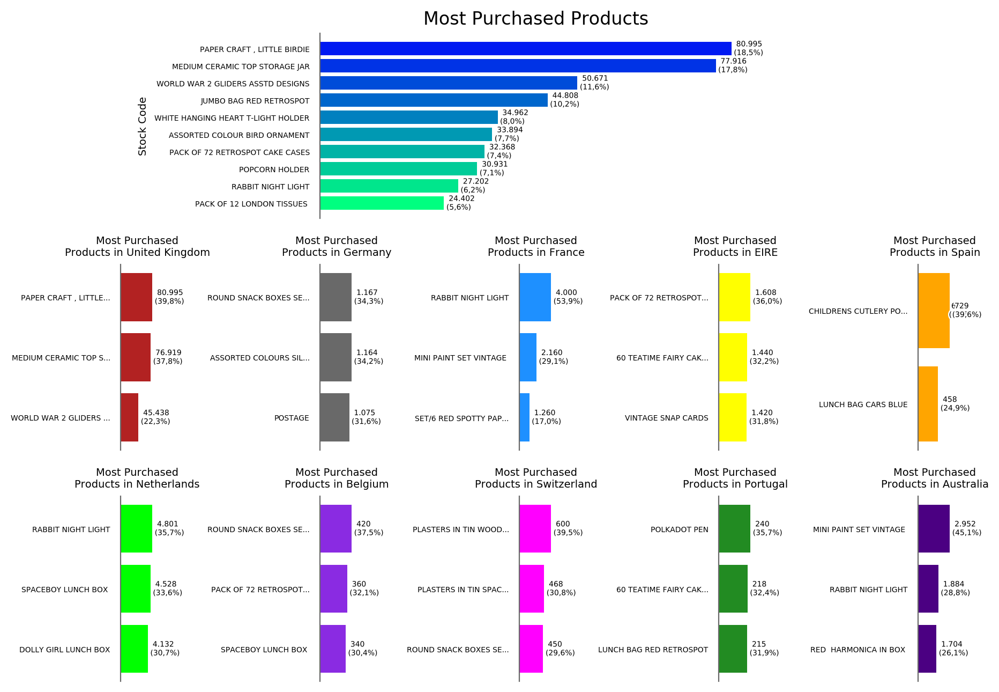

In [4]:
# Visualize Descriptive Statistics About Most Purchased Products 
def get_cmap(n, name='hsv'):
    """
    returns a function that maps each index in 0, 1, ..., n-1 
    to a distinct RGB color. the keyword argument name must 
    be a standard mpl colormap name.
    """
    cmap = plt.cm.get_cmap(name, n)
    return [cmap(i) for i in range(n)]
## get top country
plot = data.groupby('Country').count()
plot = plot[['Quantity']].sort_values('Quantity', ascending=False).reset_index()[:10]
list_country = list(plot['Country'])
## define color to barchart
list_colors = ['firebrick','dimgray','dodgerblue','yellow','orange',
               'lime','blueviolet','magenta','forestgreen','indigo']
## setup canvas for barchart
fig = plt.figure(figsize=(10, 8), dpi=200)
## split canvas into 3 rows and 5 columns
grid = plt.GridSpec(3, 5, wspace=5, hspace=.25, figure=fig)
ax = []
row = 1
col = 0
for x in range(len(list_country)):
    ax.append(fig.add_subplot(grid[row, col]))
    col+=1
    if col > 4:
        col = 0
        row+=1
## plot each country on splitted canvas
for j in range(len(list_country)):        
    country = list_country[j]
    color = list_colors[j]
    if country == 'Ireland':
        country = 'EIRE'
    ### preparing data to plot
    d = data[data['Country'] == country]
    plot = d.groupby('Description').sum()
    plot = plot[['Quantity']].sort_values('Quantity', ascending=False).reset_index()
    plot['Description'] = plot['Description'].apply(lambda x: x[:20]+'...' 
                                                    if len(x) > 23 else x)
    other_total = plot[10:].sum()['Quantity']
    ### only take 3 popular products
    plot = plot[:3]
    plot = plot.sort_values('Quantity').reset_index(drop=True)
    plot['Quantity'] = plot['Quantity'].astype(int)
    ax[j].barh(y=plot['Description'], width=plot['Quantity'], color=color)
    ax[j].spines['top'].set_visible(False)
    ax[j].spines['bottom'].set_visible(False)
    ax[j].spines['right'].set_visible(False)
    ax[j].spines['left'].set_color('dimgrey')
    ax[j].tick_params(which='major', axis='x', color='w')
    ax[j].tick_params(which='major', axis='y', color='w', labelsize=5)
    ax[j].set_xticklabels([])
    ### add label to each bar
    for i, patch in enumerate(ax[j].patches):
        bl = patch.get_xy()
        x = patch.get_width() + bl[0]
        y = .5 * patch.get_height() + bl[1] 
        gap = max(plot['Quantity'])/sum(plot['Quantity'])
        t = round(patch.get_width()/sum(plot['Quantity']) * 100, 2)
        txt = ax[j].text(x+gap,y,'  {:,}\n ({:.1f}%)'.format(patch.get_width(), t)\
                                                             .replace(',','*')\
                                                             .replace('.',',')\
                                                             .replace('*','.'),
                      ha='left', va="center", fontsize=5, color='k', rotation=0)
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='w')])
    ### add title to barchart
    ax[j].set_title('Most Purchased\nProducts in {}'.format(list_country[j]), fontsize=7)

## plot overall countries on splitted canvas
ax.append(fig.add_subplot(grid[0, 1:4]))
### preparing data to plot
plot = data.groupby('Description').sum()
plot = plot[['Quantity']].sort_values('Quantity', ascending=False).reset_index()
other_total = plot[10:].sum()['Quantity']
### only take 3 popular products
plot = plot[:10]
plot = plot.sort_values('Quantity').reset_index(drop=True)
plot['Quantity'] = plot['Quantity'].astype(int)
list_colors = get_cmap(n=11, name='winter_r')
ax[j+1].barh(y=plot['Description'], width=plot['Quantity'], color=list_colors)
ax[j+1].spines['top'].set_visible(False)
ax[j+1].spines['bottom'].set_visible(False)
ax[j+1].spines['right'].set_visible(False)
ax[j+1].spines['left'].set_color('dimgrey')
ax[j+1].tick_params(which='major', axis='x', color='w')
ax[j+1].tick_params(which='major', axis='y', color='w', labelsize=5)
ax[j+1].set_xticklabels([])
### add label to each bar
for i, patch in enumerate(ax[j+1].patches):
    bl = patch.get_xy()
    x = patch.get_width() + bl[0]
    y = .5 * patch.get_height() + bl[1] 
    gap = max(plot['Quantity'])/sum(plot['Quantity'])
    t = round(patch.get_width()/sum(plot['Quantity']) * 100, 2)
    txt = ax[j+1].text(x+gap,y,'  {:,}\n ({:.1f}%)'.format(patch.get_width(), t)\
                                                           .replace(',','*')\
                                                           .replace('.',',')\
                                                           .replace('*','.'),
                  ha='left', va="center", fontsize=5, color='k', rotation=0)
    txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='w')])
ax[j+1].set_ylabel('Stock Code', fontsize=7)
### add title to barchart
ax[j+1].set_title('Most Purchased Products')
## shows multiple barchart
plt.show()

<div align='center'>Favorite products in each country are different.<br>Factors that cause this could be due to geographical conditions.<br>I might limit the data to only using customers who are from the UK to perform RFM Analysis.</div>

#### 3. UK Data Information

In [5]:
# UK Data Information 
## filtering UK data
data = data[data['Country'] == 'United Kingdom']
## display important data information about UK
print('Total data:\n{:,}\n'.format(len(data)))
print('Total customers:\n{:,}\n'.format(len(set(data['CustomerID']))))
print('Total products bought:\n{:,}\n'.format(len(set(data['StockCode']))))
print('Total transactions:\n{:,}\n'.format(len(set(data['InvoiceNo']))))
print('Range date:\n{} ~ {}\n'.format(min(data['InvoiceDate']).strftime('%b %d, %Y %H:%M'), 
                                      max(data['InvoiceDate']).strftime('%b %d, %Y %H:%M')))
print('Country distinct:\n{}\n'.format(', '.join(list(set(data['Country'])))))
print('Total countries:\n{:,}\n'.format(len(set(data['Country']))))

Total data:
340,977

Total customers:
3,855

Total products bought:
3,609

Total transactions:
15,932

Range date:
Dec 10, 2010 09:33 ~ Dec 09, 2011 12:49

Country distinct:
United Kingdom

Total countries:
1



#### 4. Number of Transactions History

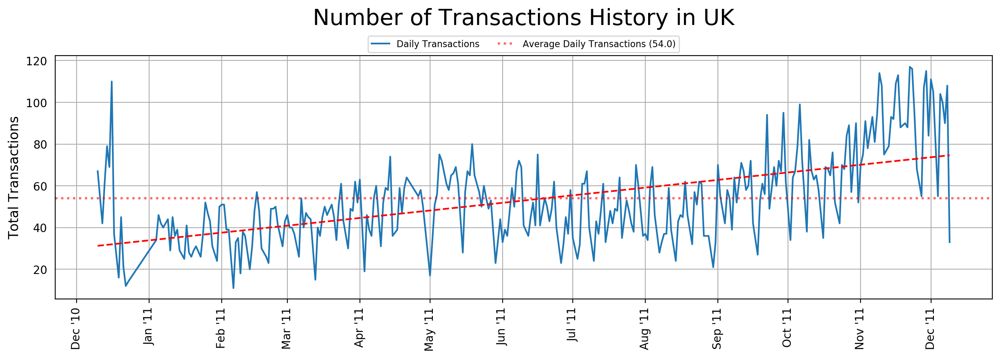

In [6]:
# Visualize Descriptive Statistics About Number of Transactions History 
## preparing data to linechart
plot = data.copy()
plot = plot[plot['Country'] == 'United Kingdom']
plot['Date'] = plot['InvoiceDate'].apply(lambda x: x.date())
plot = plot.drop_duplicates('InvoiceNo')
plot = plot.groupby(['Date']).count()[['InvoiceNo']].reset_index()
## setup the canvas for linechart
fig, ax = plt.subplots(figsize=(15, 4), dpi=200)
## plot the data
ax.plot_date(plot['Date'], plot['InvoiceNo'], linestyle='-', marker='', label='Daily Transactions')
## calculate mean data
mean = round(np.mean(plot['InvoiceNo']), 0)
## plot mean on canvas
ax.axhline(y=mean, label='Average Daily Transactions ({})'.format(mean),
           linestyle=':', color='r', alpha=.6, linewidth=2)
## calculate trendline data
x = matplotlib.dates.date2num(plot['Date'])
y = plot['InvoiceNo']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
polyX = np.linspace(x.min(), x.max(), 100)
## plot trendline on canvas
ax.plot(polyX, p(polyX), "r--")
## setup ticks
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(years_fmt)
ax.tick_params(which='major', labelrotation=90, axis='x', color='k', labelsize=10)
ax.tick_params(which='major', axis='y', color='w', labelsize=10)
## add label to y ticks
ax.set_ylabel('Total Transactions', fontsize=12)
## add title for linechart
ax.set_title('Number of Transactions History in UK', y=1.1, fontsize=20)
## add grid lines
ax.grid(True)
## add legend
plt.legend(ncol=2, loc='upper center', bbox_to_anchor=(.5,1.1), fontsize=8)
## shows linechart
plt.show()

<div align='center'>During the period of December 10, 2010 to December 9, 2011, the most customer transactions were in November 2011. The average number of customer transactions was 54 transactions. The trend line on the plot is seen rising which indicates that the number of transactions increased during the period of December 2010 to December 2011</div>

#### 5. Customer's Shopping Behavior

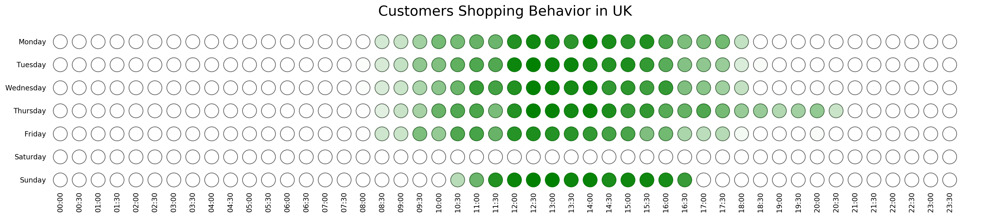

In [7]:
# Visualize Descriptive Statistics About Customer's Shopping Behavior 
def hour_rounder(t): 
    """
    a function to rounding hour minutes per half of hour
    t = datetime.datetime
    """
    x = t.hour
    y = t.minute
    if y > 30:
        y = 0
        x += 1
    else:
        y = 30
    if x < 10:
        x = '0' + str(x)
    else:
        x = str(x)
    if y < 10:
        y = '0' + str(y)
    else:
        y = str(y)
    return '{}:{}'.format(x, y)

## create default variable about actual day and hour
actual_sorter = list(reversed(list(range(7))))
actual_dayname = list(calendar.day_name)
actual_hour = sorted(['{}:{}'.format('0'+str(i),j) if i < 10 
                      else '{}:{}'.format(str(i),j) 
                      for j in ['00','30'] 
                      for i in range(24)])
actual_daytime = pd.DataFrame({'sorter': actual_sorter*len(actual_hour), 
                               'Day': actual_dayname*len(actual_hour), 
                               'Hour': actual_hour*len(actual_dayname)})
## preparing data to create a heatmap
plot = data.copy()
plot['Day'] = plot['InvoiceDate'].apply(lambda x: x.strftime('%A'))
plot['Hour'] = plot['InvoiceDate'].apply(lambda x: hour_rounder(x))
plot = plot[['Quantity','Day','Hour']]
plot = plot.groupby(['Day','Hour']).count().reset_index()
plot = pd.merge(plot, actual_daytime, on=['Day','Hour'], how='right').fillna(0)
plot['Quantity'] = plot['Quantity'].astype(int)
plot = plot.sort_values(by=['sorter','Hour']).reset_index(drop=True)[['Day','Hour','Quantity']]
## define color of each day-time based on density/most active day-time
alphas = defaultdict(list)
difference = 1/plot['Quantity'].max()
alpha = 1
for i in range(plot['Quantity'].max()):
    alphas['Alpha'].append(alpha)
    alphas['Quantity'].append(plot['Quantity'].max() - i)
    alpha -= difference
alphas = pd.DataFrame(alphas)
## merging data to colors data
plot = pd.merge(plot, alphas, on='Quantity', how='left').fillna(0)
## preparing canvas to plot a heatmap
fig = plt.figure(figsize=(25, 4), dpi=200) 
ax = fig.add_subplot(1, 1, 1)
## plot day-time on canvas
for i in range(len(plot)):
    ax.plot(plot['Hour'][i], 
            plot['Day'][i], 
            'o', 
            markersize=20, 
            clip_on=False, 
            color='g', 
            alpha=plot['Alpha'][i],
            path_effects=[PathEffects.Stroke(linewidth=1, foreground='dimgray'), PathEffects.Normal()])
## create custom y-tick labels (because original ticks too far)
ax.set_yticklabels([])
y = 0
for i in list(reversed(actual_dayname)):
    ax.annotate(s=i, xy=(-.75,y-.1), ha='right')
    y+=1
## remove border of canvas
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['top'].set_visible(False)
## setup ticks
ax.tick_params(which='both', color='w')
ax.xaxis.set_tick_params(rotation=90)
## add title to heatmap
ax.set_title('Customers Shopping Behavior in UK', fontsize=20, y=1.1)
## shows heatmap
plt.show()

<div align='center'>Customers tend to make purchases during the day, estimated at lunch time. So maybe, the majority of customers are workers / employees. There are no purchases on Saturdays on the available data. Customer transactions stop starting at 9 pm until 8am.</div>

# E. RFM and K-Means Implementation

## E1. Recency

In [8]:
# calculate recency value for each customer 
## chosen date to make dataset even a year
initiate_date = max(data['InvoiceDate']).date() + timedelta(days=1)
recency = data[['CustomerID','InvoiceDate']]
recency['Date'] = recency['InvoiceDate'].apply(lambda x: x.date())
recency = recency.groupby('CustomerID').max()[['Date']].reset_index().rename(columns={'Date':'LastPurchaseDate'})
recency['Recency'] = recency['LastPurchaseDate'].apply(lambda x: (initiate_date - x).days)
recency = recency[['CustomerID','Recency']]
recency.head()

,CustomerID,Recency
0,12346,326
1,12747,3
2,12748,1
3,12749,4
4,12820,4


## E2. Frequency

In [9]:
# calculate frequency value for each customer 
frequency = data[['CustomerID','InvoiceNo']].drop_duplicates(['CustomerID','InvoiceNo'])
frequency = frequency.groupby('CustomerID').count().reset_index().rename(columns={'InvoiceNo':'Frequency'})
frequency.head()

,CustomerID,Frequency
0,12346,1
1,12747,10
2,12748,193
3,12749,5
4,12820,4


## E3. Monetary

In [10]:
# calculate monetary value for each customer
monetary = data[['CustomerID','Quantity','UnitPrice']]
monetary['Monetary'] = monetary['Quantity']*monetary['UnitPrice']
monetary = monetary[['CustomerID','Monetary']]
monetary = monetary.groupby('CustomerID').sum().reset_index()
monetary.head()

,CustomerID,Monetary
0,12346,77183.60
1,12747,3837.45
2,12748,31718.38
3,12749,4090.88
4,12820,942.34


## E4. RFM Table

In [11]:
# merging recency, frequency and monetary as one table
rfm_table = pd.merge(recency, frequency, on='CustomerID', how='outer')
rfm_table = pd.merge(rfm_table, monetary, on='CustomerID', how='outer')
rfm_table = rfm_table.set_index('CustomerID')
rfm_table.head()

,Recency,Frequency,Monetary
CustomerID,,,
12346,326,1,77183.60
12747,3,10,3837.45
12748,1,193,31718.38
12749,4,5,4090.88
12820,4,4,942.34


## E5. RFM Distributions

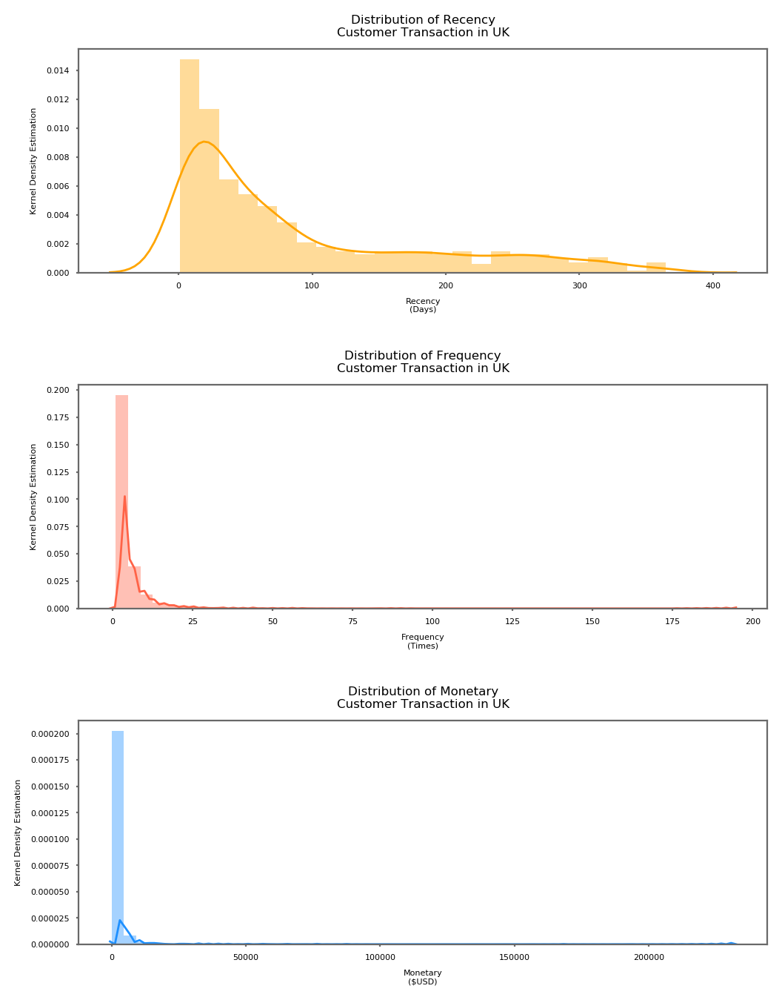

In [12]:
# Visualize RFM distributions
colors =['orange','tomato','dodgerblue']
fig = plt.figure(figsize=(15, 8), dpi=200)
## split canvas into 3 rows and 2 columns
grid = plt.GridSpec(3, 2, wspace=.5, hspace=.5, figure=fig)
ax = []
row = 0
for x in range(len(rfm_table.columns)):
    param = rfm_table.columns[x]
    if param == 'Recency':
        unit = 'Days'
    elif param == 'Frequency':
        unit = 'Times'
    elif param == 'Monetary':
        unit = '$USD'
    ax.append(fig.add_subplot(grid[row, 1]))
    sns.distplot(rfm_table[param], color=colors[x], ax=ax[x], norm_hist=True, kde_kws={'lw':1})
    ax[x].tick_params(which='major', axis='both', color='dimgrey', labelsize=4, length=1)
    ax[x].set_xlabel('{}\n({})'.format(param, unit), fontsize=4)
    ax[x].set_ylabel('Kernel Density Estimation', fontsize=4)
    ax[x].set_title('Distribution of {}\nCustomer Transaction in UK'.format(param), fontsize=6)
    ax[x].spines['left'].set_color('dimgrey')
    ax[x].spines['right'].set_color('dimgrey')
    ax[x].spines['top'].set_color('dimgrey')
    ax[x].spines['bottom'].set_color('dimgrey')
    row+=1

plt.show()

<div align='left'>1. The recency of customer transactions is normally distributed in unimodal and right-skewed forms.<br>
    2. The frequency of customer transactions is normally distributed in unimodal and right-skewed forms.<br>
    3. Customer's total spend money is normally distributed in unimodal and right-skewed forms.<br><br>As mentioned on IBM Knowledge Center:<br>
    <em>
    "The histograms show the relative distribution of values for the three variables used to calculate recency, frequency, and monetary scores. <strong>It is not unusual for these histograms to indicate somewhat skewed distributions</strong> rather than a normal or symmetrical distribution."
    </em>
    <br><br>Helpful articles: <br>
    <a href='https://www.data-to-viz.com/graph/density.html'>What is Density?</a>
    <br>
    <a href='https://chemicalstatistician.wordpress.com/2013/06/09/exploratory-data-analysis-kernel-density-estimation-in-r-on-ozone-pollution-data-in-new-york-and-ozonopolis/'>What is Kernel Density Estimation?</a>
    <br>
    <a href='https://www.statisticshowto.datasciencecentral.com/probability-and-statistics/skewed-distribution/#targetText=In%20a%20normal%20distribution%2C%20the,the%20right%20of%20the%20median.'>Skewed Distribution</a>
    <br>
    <a href='https://www.ibm.com/support/knowledgecenter/en/SSLVMB_24.0.0/spss/rfm/idh_rfm_output_transactions.html'>Skewed Histogram on RFM</a>
        </div>

## E6. Customer Segmentation using RFM Model

#### 1. Create RFM Model

In [13]:
# calculate quintilse for each parameters 
quintiles = rfm_table.quantile(q=[0.2,0.4,0.6,0.8])
quintiles = quintiles.to_dict()
quintiles

{'Recency': {0.2: 13.0, 0.4: 32.0, 0.6: 68.0, 0.8: 171.0},
 'Frequency': {0.2: 1.0, 0.4: 2.0, 0.6: 3.0, 0.8: 5.0},
 'Monetary': {0.2: 234.22600000000003,
  0.4: 457.87,
  0.6: 887.3260000000004,
  0.8: 1905.8480000000004}}

<div>
    <strong>
        Short explanation:<br>
    </strong>
    I am using Quintiles Method, so there are five limit values for each RFM parameters that represents different class.
    <br><br>
    Helpful Article:<br>
    <a href='https://ec.europa.eu/eurostat/statistics-explained/index.php/Beginners:Statistical_concept_-_Quintile_and_decile'>What is Quintiles?</a>
    
</div>

In [14]:
# scoring recency, frequency and monetary 
def R_Score(value, quintiles):
    """
    a function to give score for recency. 
    where 1 means high recency and 5 means low recency.
    """
    if value <= quintiles['Recency'][0.2]:
        return 5
    elif value <= quintiles['Recency'][0.4]:
        return 4
    elif value <= quintiles['Recency'][0.6]:
        return 3
    elif value <= quintiles['Recency'][0.8]:
        return 2
    else:
        return 1
    
def FM_Score(value, quintiles, var):
    """
    a function to give score for frequency and monetary. 
    where 1 means low frequency & monetary and 
    5 means high frequency & monetary.
    """
    if value <= quintiles[var][0.2]:
        return 1
    elif value <= quintiles[var][0.4]:
        return 2
    elif value <= quintiles[var][0.6]:
        return 3
    elif value <= quintiles[var][0.8]:
        return 4
    else:
        return 5
    
rfm_table['RecencyScore'] = rfm_table['Recency'].apply(lambda recency: R_Score(recency, quintiles))
rfm_table['FrequencyScore'] = rfm_table['Frequency'].apply(lambda frequency: FM_Score(frequency, quintiles, 'Frequency'))
rfm_table['MonetaryScore'] = rfm_table['Monetary'].apply(lambda monetary: FM_Score(monetary, quintiles, 'Monetary'))
rfm_table.head()

,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore
CustomerID,,,,,,
12346,326,1,77183.60,1,1,5
12747,3,10,3837.45,5,5,5
12748,1,193,31718.38,5,5,5
12749,4,5,4090.88,5,4,5
12820,4,4,942.34,5,4,4


<div>
    <strong>
        Short explanation:<br>
    </strong>
    The given score for each parameter based on limit value of Quintiles.<br>For example:<br>If Recency has limit value 2, 4, 6, 8, and customer's Recency value (RV) is 5. Then, customer's Recency score (RS) will be 3. Because RV = 5 is between limit value 4 & 6, which means <em>Class 3</em>.
    <br><br>    
</div>

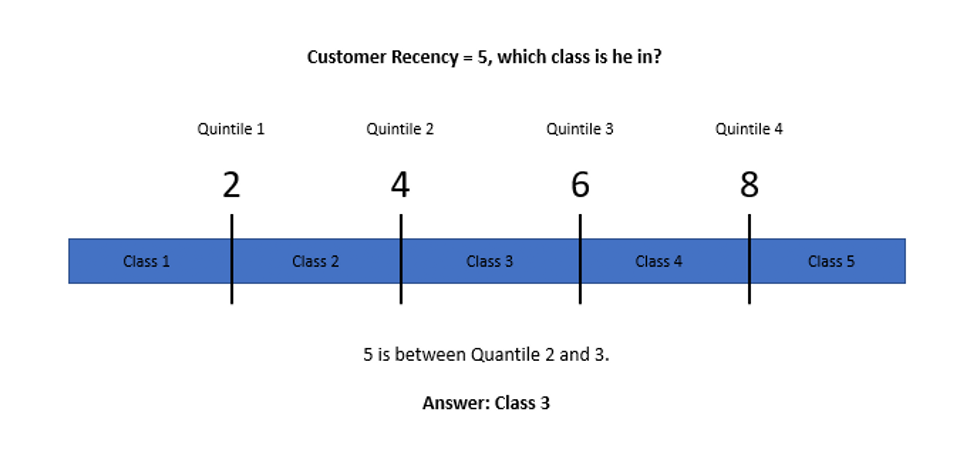

In [15]:
example_score_recency()

In [16]:
# combining score called RFM score 
rfm_table['RFM_Score'] = rfm_table[['RecencyScore','FrequencyScore','MonetaryScore']].apply(lambda x: '{}{}{}'.format(x[0],x[1],x[2]), axis=1)
rfm_table.head()

,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_Score
CustomerID,,,,,,,
12346,326,1,77183.60,1,1,5,115
12747,3,10,3837.45,5,5,5,555
12748,1,193,31718.38,5,5,5,555
12749,4,5,4090.88,5,4,5,545
12820,4,4,942.34,5,4,4,544


<div>
    <strong>
        Short explanation:<br>
    </strong>
    RFM Score is simply only combination of the score of each RFM parameters. If R = 5, F = 4, and M = 2, then RFM Score = 542
</div>

#### 2. Customer Segmentation Index

<div align='center'><h3><strong>Customer Segmentation Index</strong></h3></div>

|No.|RScore|FScore|MScore|RFM Scores|Customer Segment|Activity|Actionable Tip|
|---|------|------|------|----------|----------------|--------|--------------|
|1.|5|5|4 - 5|554; 555|Best Customers|Bought recently, buy often and spend the most!|Reward them. Can be early adopters for new products. Will promote your brand.|
|2.|5|4 - 5|3 - 5|543; 544; 545; 553|Loyal Customers|Spend good money with us often. Responsive to promotions.|Upsell higher value products. Ask for reviews. Engage them.|
|3.|3 - 5|3 - 5|3 - 5|333; 334; 335; 343; 344; 345; 353; 354; 355; 433; 434; 435; 443; 444; 445; 453; 454; 455; 533; 534; 535|Potential Loyalist|Recent customers, but spent a good amount and bought more than once.|Offer membership / loyalty program, recommend other products.|
|4.|4 - 5|1 - 2|1 - 5|411; 412; 413; 414; 415; 421; 422; 423; 424; 425; 511; 512; 513; 514; 515; 521; 522; 523; 524; 525|Recent Customers|Bought most recently, but not often.|Provide on-boarding support, give them early success, start building relationship.|
|5.|3 - 5|3 - 5|1 - 2|331; 332; 341; 342; 351; 352; 431; 432; 441; 442; 451; 452; 531; 532; 541; 542; 551; 552|Promising|Recent shoppers, but haven’t spent much.|Create brand awareness, offer free trials.|
|6.|2|3 - 5|3 - 5|233; 234; 235; 243; 244; 245; 253; 254; 255|Customers Needing Attention|Above average recency, frequency and monetary values. May not have bought very recently though.|Make limited time offers, Recommend based on past purchases. Reactivate them.|
|6.|3|1 - 2|3 - 5|313; 314; 315; 323; 324; 325|Customers Needing Attention|Above average recency, frequency and monetary values. May not have bought very recently though.|Make limited time offers, Recommend based on past purchases. Reactivate them.|
|7.|2|1 - 3|1 - 3|211; 212; 213; 221; 222; 223; 231; 232|About To Sleep|Below average recency, frequency and monetary values. Will lose them if not reactivated.|Share valuable resources, recommend popular products / renewals at discount, reconnect with them.|
|8.|1|4 - 5|4 - 5|144; 145; 154; 155|Can't Lose Them|Made biggest purchases, and often. But haven’t returned for a long time.|Win them back via renewals or newer products, don’t lose them to competition, talk to them.|
|9.|1|1 - 2|1 - 2|111; 112; 121; 122|Lost Cheap|Lowest recency, frequency and monetary scores.|Revive interest with reach out campaign, ignore otherwise.
|
|10.|1|~|~|113; 114; 115; 123; 124; 125 131; 132; 133; 134; 135; 141; 142; 143; 151; 152; 153|Hibernating|Last purchase was long back, might a low spenders and low number of orders.|Offer other relevant products and special discounts. Recreate brand value.|
|11.|2|~|~|214; 215; 224; 225; 241; 242; 251; 252|At Risk|Might spent big money and purchased often. But long time ago. Need to bring them back!|Send personalized emails to reconnect, offer renewals, provide helpful resources.|
|12.|3|~|~|311; 312; 321; 322|Still Doubt|Still purchase but only a little.|Make sure him that our products is the best offer!|

<div>Reference:<br>
    <a href='https://www.putler.com/rfm-analysis/'>Customer Segments with RFM Model</a>
    <br><br>
    I made Customer Segmentation Index based on reference site above with some customizations.
</div>

#### 3. Classifying RFM Score

In [17]:
# classify each RFM Score based on customer segmentation index 
def segment_classifier(recency, frequency, monetary):
    if (recency == 5) & (frequency == 5) & (4 <= monetary <= 5):
        label = 'Champions'
    elif (recency == 5) & (4 <= frequency <= 5) & (3 <= monetary <= 5):
        label = 'Loyal Customers'
    elif (3 <= recency <= 5) & (3 <= frequency <= 5) & (3 <= monetary <= 5):
        label = 'Potential Loyalist'
    elif (4 <= recency <= 5) & (1 <= frequency <= 2) & (1 <= monetary <= 5):
        label = 'Recent Customers'
    elif (3 <= recency <= 5) & (3 <= frequency <= 5) & (1 <= monetary <= 2):
        label = 'Promising'
    elif (recency == 2) & (3 <= frequency <= 5) & (3 <= monetary <= 5):
        label = 'Customer Needing Attention'
    elif (recency == 3) & (1 <= frequency <= 2) & (3 <= monetary <= 5):
        label = 'Customer Needing Attention'
    elif (recency == 2) & (1 <= frequency <= 3) & (1 <= monetary <= 3):
        label = 'About To Sleep'
    elif (recency == 1) & (4 <= frequency <= 5) & (4 <= monetary <= 5):
        label = 'Cant Lose Them'
    elif (recency == 1) & (1 <= frequency <= 2) & (1 <= monetary <= 2):
        label = 'Lost Cheap'
    elif (recency == 1):
        label = 'Hibernating'
    elif (recency == 2):
        label = 'At Risk'
    elif (recency == 3):
        label = 'Still Doubt'
    return label
rfm_table['CustomerSegment'] = rfm_table[[
                                         'RecencyScore',
                                         'FrequencyScore',
                                         'MonetaryScore'
                                        ]].apply(lambda x: segment_classifier(x[0],x[1],x[2]), axis=1)
rfm_table.head()

,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_Score,CustomerSegment
CustomerID,,,,,,,,
12346,326,1,77183.60,1,1,5,115,Hibernating
12747,3,10,3837.45,5,5,5,555,Champions
12748,1,193,31718.38,5,5,5,555,Champions
12749,4,5,4090.88,5,4,5,545,Loyal Customers
12820,4,4,942.34,5,4,4,544,Loyal Customers


In [18]:
# calculate total customer of each segment 
cust_segment = rfm_table.groupby('CustomerSegment').count()\
                                                   .rename(columns={'RFM_Score':'Count'})\
                                                   .sort_values('Count', ascending=False)\
                                                   .reset_index()
                                                   
cust_segment = cust_segment[['CustomerSegment','Count']]
## calculate the percentage
cust_segment['Percentage'] = cust_segment['Count'].apply(lambda x: '\n{:.2f}%'.format(x/sum(cust_segment['Count'])*100))
## define color for each segment
cm = plt.get_cmap('YlGnBu_r')
cust_segment['Colors'] = [cm(i/len(cust_segment)) for i in range(len(cust_segment))]
cust_segment

,CustomerSegment,Count,Percentage,Colors
0,Potential Loyalist,825,\n21.40%,"(0.03137254901960784, 0.11372549019607843, 0.3..."
1,Lost Cheap,541,\n14.03%,"(0.10629757785467128, 0.17314878892733565, 0.5..."
2,Recent Customers,468,\n12.14%,"(0.141361014994233, 0.25623990772779703, 0.605..."
3,About To Sleep,458,\n11.88%,"(0.13317954632833526, 0.3701960784313726, 0.65..."
4,Customer Needing Attention,397,\n10.30%,"(0.12026143790849673, 0.5019607843137255, 0.72..."
5,Champions,389,\n10.09%,"(0.15967704728950396, 0.6158554402153017, 0.75..."
6,Still Doubt,276,\n7.16%,"(0.25871587850826605, 0.7151403306420607, 0.76..."
7,Hibernating,210,\n5.45%,"(0.41890042291426377, 0.774563629373318, 0.744..."
8,Loyal Customers,144,\n3.74%,"(0.592156862745098, 0.8405228758169935, 0.7241..."
9,At Risk,71,\n1.84%,"(0.7838985005767013, 0.9151095732410611, 0.705..."


#### 4. Visualize RFM Customer Segmentation

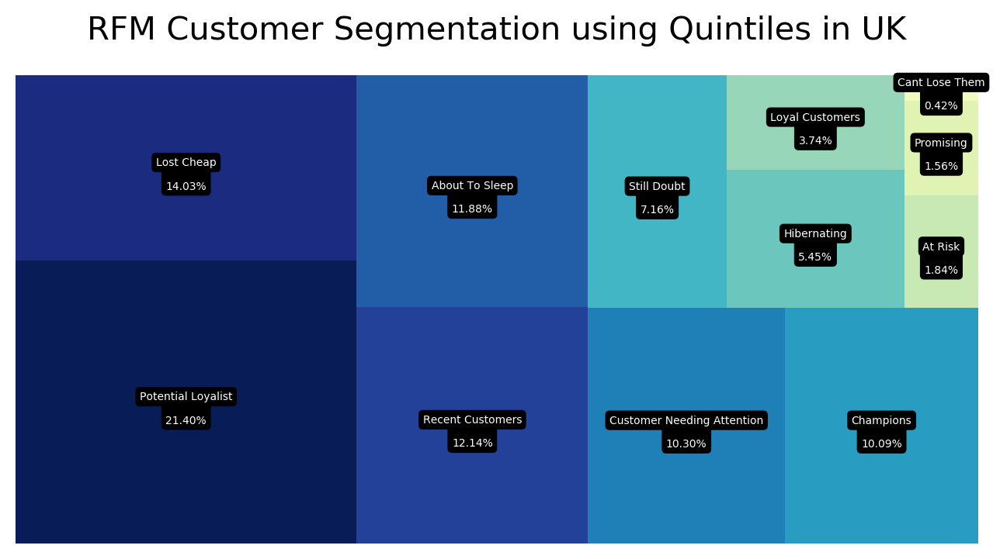

,CustomerSegment,Total Customers
0,Potential Loyalist,825
1,Lost Cheap,541
2,Recent Customers,468
3,About To Sleep,458
4,Customer Needing Attention,397
5,Champions,389
6,Still Doubt,276
7,Hibernating,210
8,Loyal Customers,144
9,At Risk,71


In [19]:
# Visualize customer segmentation using treemap 
## preparing the canvas
fig, ax = plt.subplots(figsize=(8,4), dpi=200)
## create text box
text_box = dict(boxstyle="round",
                ec='k',
                fc='k')
## plot the data
squarify.plot(sizes=cust_segment['Count'],
              value=cust_segment['Percentage'],
              label=cust_segment['CustomerSegment'],
              color=cust_segment['Colors'],
              text_kwargs={'c':'w', 'bbox': text_box, 'size': 5, 'rotation': 0},
              norm_x=100,
              norm_y=50)
## remove border of canvas
ax.axis('off')
## add title for treemap
ax.set_title('RFM Customer Segmentation using Quintiles in UK', fontsize=15, y=1.05)
## shows treemap
plt.show()

display(cust_segment[['CustomerSegment','Count']]
        .rename(columns={'Count':'Total Customers'}))

From the results of customer segmentation using RFM, there are several important points as follows:
- <strong>Lost Cheap<br></strong>
The company has lost around 14% (541) of customers who did not make many transactions and spent a lot of money.
- <strong>Cant Lose Them<br></strong>
The company has lost around 0.4% (16) customers, even though it has done a lot of transactions and spent a lot of money. Try pulling them back because it produces a lot of benefits.
- <strong>Recent Customers<br></strong>
The company gained around 12% (468) new customers.
- <strong>Loyal Customers<br></strong>
The company only has loyal customers of 3.74% (144).
- <strong>Champions<br></strong>
There are about 10% (389) customers who have done transactions very often and spend a lot of money.
- <strong>Customer Needing Attention, About To Sleep, At Risk<br></strong>
Around 24% (926) customers need special attention so that the company no longer loses customers.
- <strong>Promising, Still Doubt<br></strong>
Companies need to make a more attractive offer to about 8% (336) customers, because they are still doubtful even though they have traded often enough.
- <strong>Potential Loyalist<br></strong>
As many as 21.4% (825) customers have the potential to become Loyal Customers, the company can give them rewards so that the target can be met.

## E7. Customer Segmentation using K-Means

#### 1. Data Correction

In [20]:
# K-Means Data Preparation 
## handling skewed data using log transformation
rfm_kmeans = rfm_table.copy()
rfm_log = rfm_kmeans[['Recency','Frequency','Monetary']]
rfm_log = rfm_log.applymap(lambda x: 1 if x == 0 else x)
rfm_log = rfm_log.applymap(lambda x: np.log(x)).round(3)

## scaling data to prevent bias
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_log)
rfm_scaled = pd.DataFrame(rfm_scaled)
rfm_scaled.columns = ['Recency','Frequency','Monetary']
rfm_scaled.head()

,Recency,Frequency,Monetary
0,1.482717,-1.039622,3.795839
1,-1.950203,1.541768,1.385250
2,-2.754977,4.859578,3.081739
3,-1.740039,0.763877,1.436659
4,-1.740039,0.513920,0.256667


As we know that the Recency, Frequency and Monetary distributions are right-skewed, so we need to transform the data using log transformation. Then, after transforming the data, the units of the three parameters are different, so we also need to scaling the data to avoid bias.

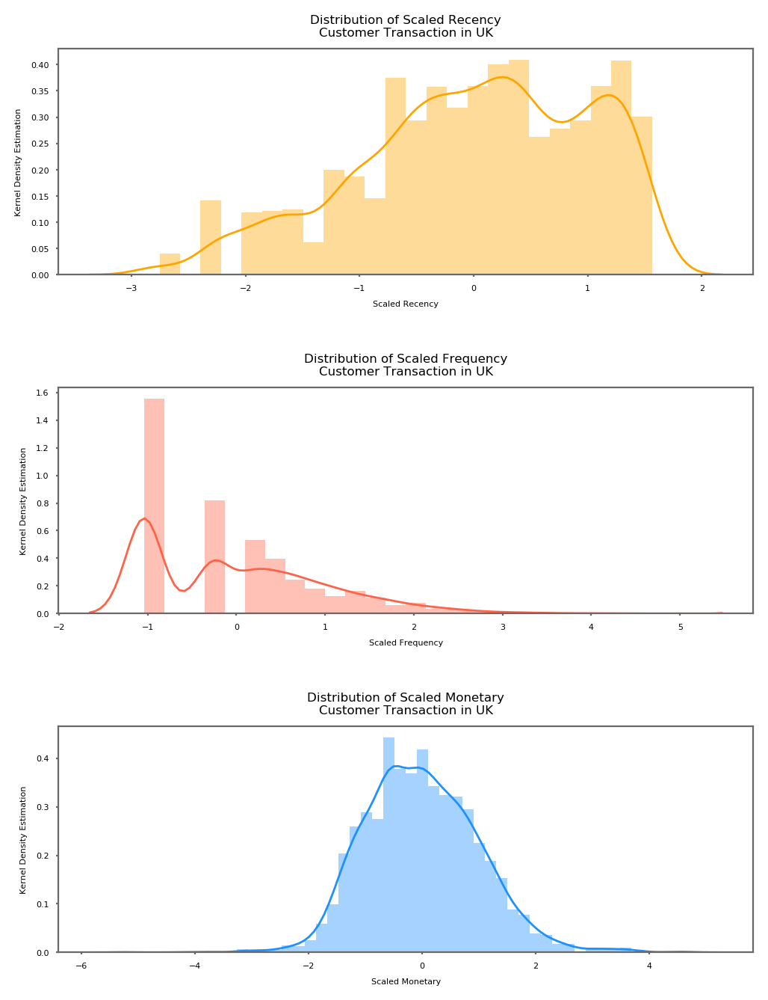

In [21]:
# Visualize Scaled RFM Distributions 
## define color for each RFM parameters
colors =['orange','tomato','dodgerblue']
## create a canvas to plot
fig = plt.figure(figsize=(15, 8), dpi=200)
## split canvas into 3 rows and 2 columns
grid = plt.GridSpec(3, 2, wspace=.5, hspace=.5, figure=fig)
ax = []
row = 0
## plot data for each parameters to splitted canvas
for x in range(len(rfm_scaled.columns)):
    param = rfm_scaled.columns[x]
    ax.append(fig.add_subplot(grid[row, 1]))
    sns.distplot(rfm_scaled[param], color=colors[x], ax=ax[x], norm_hist=True, kde_kws={'lw':1})
    ### setup ticks
    ax[x].tick_params(which='major', axis='both', color='dimgrey', labelsize=4, length=1)
    ### add title to x & y ticks 
    ax[x].set_xlabel('Scaled {}'.format(param), fontsize=4)
    ax[x].set_ylabel('Kernel Density Estimation', fontsize=4)
    ### add title to distribution plot
    ax[x].set_title('Distribution of Scaled {}\nCustomer Transaction in UK'.format(param), fontsize=6)
    ### change color border of canvas
    ax[x].spines['left'].set_color('dimgrey')
    ax[x].spines['right'].set_color('dimgrey')
    ax[x].spines['top'].set_color('dimgrey')
    ax[x].spines['bottom'].set_color('dimgrey')
    row+=1
## shows distibution plot
plt.show()

<div align='center'>After preprocessing data, the current distribution looks rather norm compared to before. With this condition, now we can start to implementing K-Means.</div>

#### 2. Find Optimal Cluster

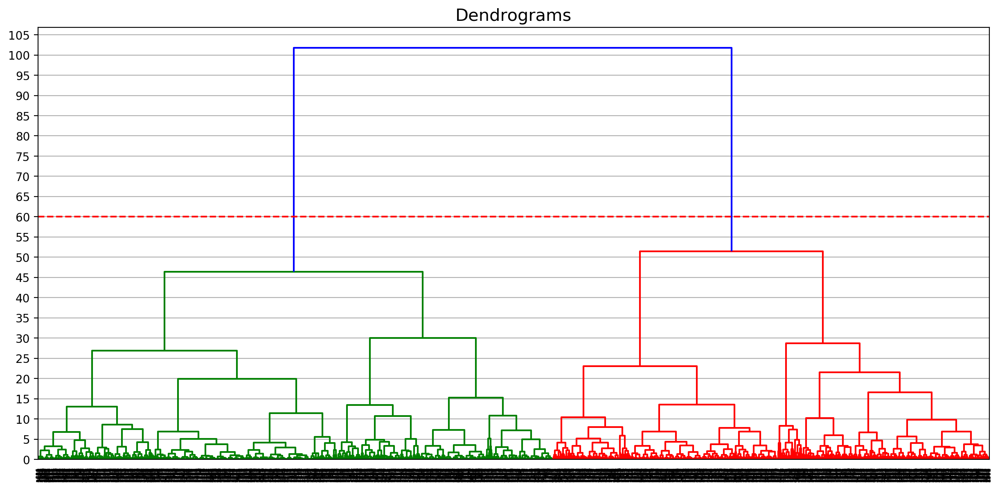

In [22]:
# Visualize Dendrograms to Find Optimal Number of Cluster 
## preparing the canvas for dendrograms
fig, ax = plt.subplots(figsize=(15, 7), dpi=200)
## plot data to dendrogram
dend = shc.dendrogram(shc.linkage(rfm_scaled, method='ward'))
## create horizontal line to show optimal number of cluster
plt.axhline(y=60, color='r', linestyle='--')
## add title to dendograms
plt.title("Dendrograms", fontsize=15)
## shows grid
loc = matplotlib.ticker.MultipleLocator(base=5)
ax.yaxis.set_major_locator(loc)
ax.grid(True, axis='y')
## shows dendograms
plt.show()

<div align='center'>Dendrograms aims to find how optimal the cluster is formed from existing data. Where the optimal selection of many clusters is to look at the longest line on the dendrograms. On the dendrograms above, the blue line is the longest line. So, I made a red horizontal line to indicate that the optimal cluster formed was 2 clusters.</div>

#### 3. K-Means Implementation

In [23]:
# Clustering with K-Means 
## setup cluster preferences
clus = KMeans(n_clusters= 2, init= 'k-means++', max_iter= 300)
clus.fit(rfm_scaled)
## assign the clusters to dataset
rfm_kmeans['K_Cluster'] = clus.labels_
rfm_kmeans['K_Cluster'] = rfm_kmeans['K_Cluster'].apply(lambda x: 'Cluster {}'.format(x+1))
display(rfm_kmeans.head())

,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_Score,CustomerSegment,K_Cluster
CustomerID,,,,,,,,,
12346,326,1,77183.60,1,1,5,115,Hibernating,Cluster 2
12747,3,10,3837.45,5,5,5,555,Champions,Cluster 2
12748,1,193,31718.38,5,5,5,555,Champions,Cluster 2
12749,4,5,4090.88,5,4,5,545,Loyal Customers,Cluster 2
12820,4,4,942.34,5,4,4,544,Loyal Customers,Cluster 2


#### 4. Visualize K-Means Cluster

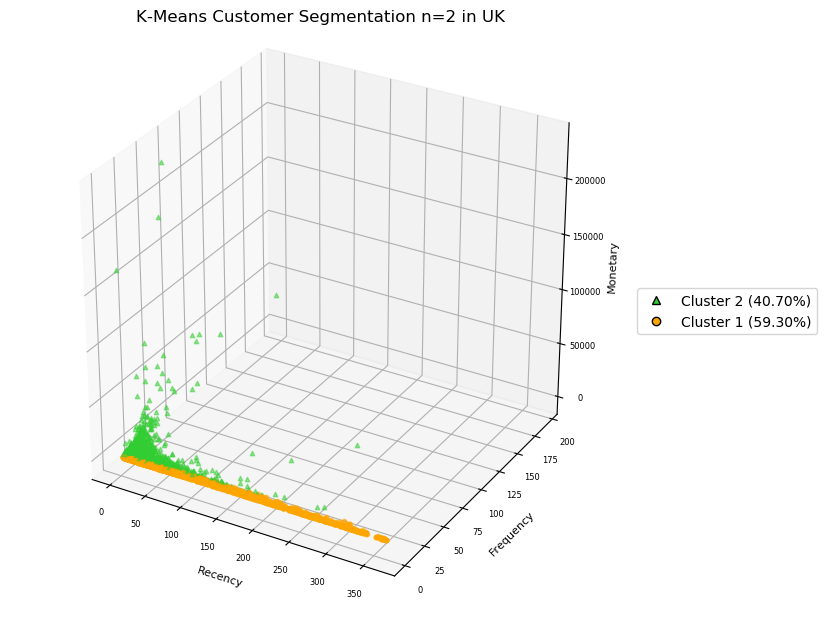

In [24]:
# Visualize cluster K-Means 
percentage = rfm_kmeans.groupby('K_Cluster').count()[['CustomerSegment']]
total = percentage.sum()
percentage = (percentage/total*100).round(3)
## preparing the canvas
fig = plt.figure(figsize=(8,8), dpi=100)
ax = fig.add_subplot(111, projection='3d')
## plotting recency, frequency, monetary as x, y, z
custom_lines = []
labels = []
check = []
for i in range(len(rfm_kmeans)):
    ### give different color and shape to each cluster
    if rfm_kmeans['K_Cluster'][i] == 'Cluster 1':
        color = 'orange'
        m = 'o'
    else:
        color = 'limegreen'
        m = '^'
    ax.scatter3D(rfm_kmeans['Recency'][i], 
                 rfm_kmeans['Frequency'][i], 
                 rfm_kmeans['Monetary'][i], 
                 c=color, 
                 marker=m, 
                 s=10, 
                 alpha=.5,
                 label=rfm_kmeans['K_Cluster'][i])
    ### add label to each axis
    ax.set_xlabel('Recency', fontsize=8)
    ax.set_ylabel('Frequency', fontsize=8)
    ax.set_zlabel('Monetary', fontsize=8)
    ax.tick_params(labelsize=6)
    if m not in check:
        check.append(m)
        perc = percentage.loc[rfm_kmeans['K_Cluster'][i]][0]
        labels.append('{} ({:.2f}%)'.format(rfm_kmeans['K_Cluster'][i], perc))
        custom_lines.append(plt.Line2D([],[], ls="none", marker=m, c=color, markeredgecolor='k'))
        
ax.legend(custom_lines, labels, 
          loc='center left', bbox_to_anchor=(1.0, .5))
## add title scatter
ax.set_title('K-Means Customer Segmentation n=2 in UK', fontsize=12, y=1.05)
## shows scatter3D
plt.show()

From the plot above we can see that Cluster 2 contains customers that spent a lot of money and made more transactions than customers from Cluster 1. 

## E8. Comparing RFM Segmentation and K-Means Clustering

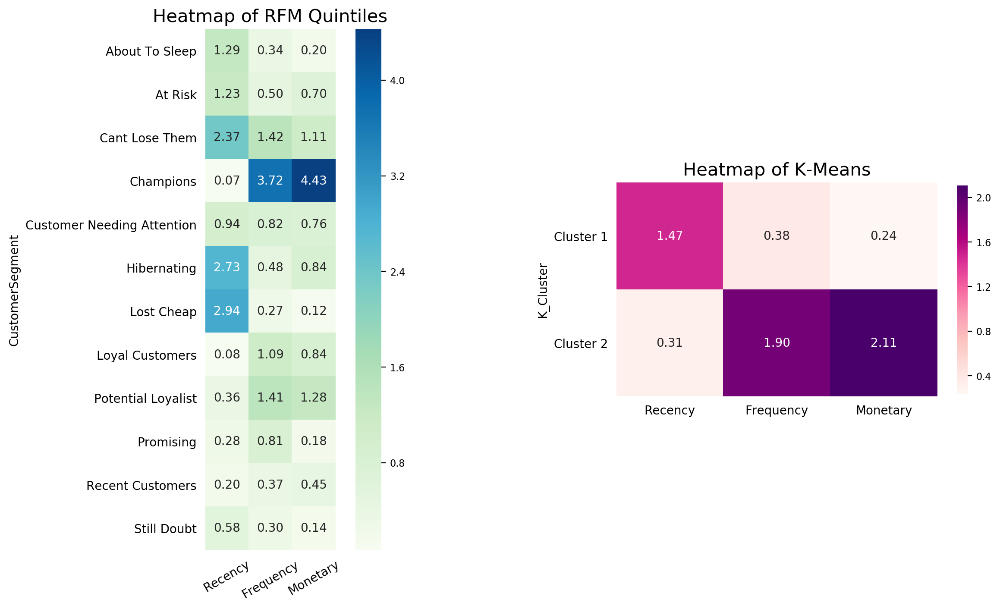

Recency                                   \
CustomerSegment About To Sleep At Risk Cant Lose Them Champions   
K_Cluster                                                         
Cluster 1                458.0    69.0            7.0       NaN   
Cluster 2                  NaN     2.0            9.0     389.0   

                                                                   \
CustomerSegment Customer Needing Attention Hibernating Lost Cheap   
K_Cluster                                                           
Cluster 1                            255.0       207.0      541.0   
Cluster 2                            142.0         3.0        NaN   

                                                                               \
CustomerSegment Loyal Customers Potential Loyalist Promising Recent Customers   
K_Cluster                                                                       
Cluster 1                   NaN               61.0      37.0            375.0   
Cluster 2                 144.0              764.0      23.0             93.0   

                             
CustomerSegment Still Doubt  
K_Cluster                    
Cluster 1             276.0  
Cluster 2               NaN

In [25]:
# Comparing RFM Segment and K-Means 
# the mean value in total 
total_avg = rfm_table[['Recency','Frequency','Monetary']].mean()

# calculate the proportional gap with total mean
cluster_avg_rfm = rfm_table.groupby('CustomerSegment').mean().iloc[:, 0:3]
prop_rfm = cluster_avg_rfm/total_avg

# calculate the proportional gap with total mean
cluster_avg_K = rfm_kmeans.groupby('K_Cluster').mean().iloc[:, 0:3]
prop_rfm_K = cluster_avg_K/total_avg

# create a canvas to plot
fig = plt.figure(figsize=(15, 8), dpi=200)
# split canvas into 3 rows and 2 columns
grid = plt.GridSpec(2, 2, wspace=.5, hspace=.5, figure=fig)
ax1 = fig.add_subplot(grid[0:, 0])
# heatmap with RFM
sns.heatmap(prop_rfm, cmap='GnBu', square=True, ax=ax1, annot=True, fmt='.2f')
# use matplotlib.colorbar.Colorbar object
cbar = ax1.collections[0].colorbar
cbar.ax.tick_params(labelsize=8)
ax1.tick_params(axis='x', rotation=30)
ax1.tick_params(axis='both', color='w')
ax1.set_title('Heatmap of RFM Quintiles', fontsize=15)
b, t = ax1.get_ylim()
b += 0.5
t -= 0.5
ax1.set_ylim(b, t)

ax2 = fig.add_subplot(grid[0:, 1])
# heatmap with RFM
sns.heatmap(prop_rfm_K, cmap='RdPu', square=True, ax=ax2, annot=True, fmt='.2f', cbar_kws={'shrink': .4})
# use matplotlib.colorbar.Colorbar object
cbar = ax2.collections[0].colorbar
cbar.ax.tick_params(labelsize=8)
ax2.tick_params(axis='y', rotation=0)
ax2.tick_params(axis='both', color='w')
ax2.set_title('Heatmap of K-Means', fontsize=15)
b, t = ax2.get_ylim()
b += 0.5
t -= 0.5
ax2.set_ylim(b, t)
plt.show()

resume_kmeans = rfm_kmeans.groupby(['K_Cluster','CustomerSegment']).count()
resume_kmeans = resume_kmeans[['Recency']].unstack('CustomerSegment')
display(resume_kmeans)

<div>
    The Customer Segmentation from RFM result merged into 2 cluster.<br>
    <strong>Cluster 1:<br></strong>
    About To Sleep, At Risk, Hibernating, Lost Cheap, Recent Customers, Still Doubt<br>
    <strong>Cluster 2:<br></strong>
    Champions, Loyal Customers, Potential Loyalist<br>
    <strong>Ambiguity:<br></strong>
    Cant Lose Them, Customer Needing Attention, Promising<br>
    
</div>

# F. Conclusion

RFM analysis is a simple approach to segmenting customers. This can be done with data that supports the parameters needed to create an RFM table. We can also change parameters if our business has other parameters.
For the hotel business, many variables can be tried to segment customers, I think we can try using several parameters such as:
- Recency
- Frequency
- Monetary
- Duration (length of stay on one visit)
- Engagements (customer reviews)

In addition we can classify based on customer demographics. And combining RFM results with demographic grouping results.

# G. References

<div>
    Good to read:<br>
    <a href='https://towardsdatascience.com/who-is-your-golden-goose-cohort-analysis-50c9de5dbd31'>TDS - Who Is Your Golden Goose?: Cohort Analysis</a>
    <br>
    <a href='https://towardsdatascience.com/clustering-algorithms-for-customer-segmentation-af637c6830ac'>TDS - Clustering algorithms for customer segmentation</a>
    <br>
    <a href='https://en.wikipedia.org/wiki/RFM_(customer_value)'>Wikipedia - RFM (customer value)</a>
    <br>
    <a href='https://www.putler.com/rfm-analysis/'>Putler - RFM Analysis For Successful Customer Segmentation</a>
    <br>
    <a href='https://www.optimove.com/resources/learning-center/rfm-segmentation'>Optimove - RFM Segmentation</a>
    <br>
    <a href='https://www.kaggle.com/sarahm/customer-segmentation-using-rfm-analysis'>Kaggle - Customer Segmentation using RFM Analysis</a>
    <br>
    <a href='https://www.kaggle.com/fabiendaniel/customer-segmentation'>Kaggle - Customer Segmentation</a>
    <br>
    <a href='https://dialedseo.com/customer-retention-in-hotel-industry-rfm-model/'>Otium Boutique - IMPROVING CUSTOMER RETENTION IN THE HOTEL INDUSTRY WITH THE RFM MODEL</a>
    <br>
    <a href='https://www.data-mania.com/blog/customer-profiling-and-segmentation-in-python/'>DataMania - CUSTOMER PROFILING AND SEGMENTATION IN PYTHON | A CONCEPTUAL OVERVIEW AND DEMONSTRATION</a>
    <br>
    <a href='https://medium.com/@henryfeng/rfm-analysis-customer-churn-analysis-for-hotel-mall-enterprise-in-china-d2c6dc794d27'>Medium - RFM Analysis & Customer Churn Analysis for Hotel/Mall Enterprise in China</a>
</div>